In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import math
import re

from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer, WordNetLemmatizer
import nltk

In [ ]:
# Download necessary NLTK data
nltk.download('wordnet')
nltk.download('omw-1.4')  # If using a newer version of NLTK
nltk.download('punkt')  # For tokenization
nltk.download('stopwords')  # For stopwords

In [ ]:
# Initialize stopwords, stemmer, and lemmatizer
stop_words = set(stopwords.words('english'))
stemmer = SnowballStemmer('english')
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
df = pd.read_csv("/content/combined_data.csv")
df.head()

,label,text
0,1,ounce feather bowl hummingbird opec moment ala...
1,1,wulvob get your medircations online qnb ikud v...
2,0,computer connection from cnn com wednesday es...
3,1,university degree obtain a prosperous future m...
4,0,thanks for all your answers guys i know i shou...


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60136 entries, 0 to 60135
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   label   60136 non-null  int64 
 1   text    60136 non-null  object
dtypes: int64(1), object(1)
memory usage: 939.8+ KB


In [ ]:
label_counts = df['label'].value_counts()
labels = ['spam', 'ham']

label
1    31645
0    28491
Name: count, dtype: int64


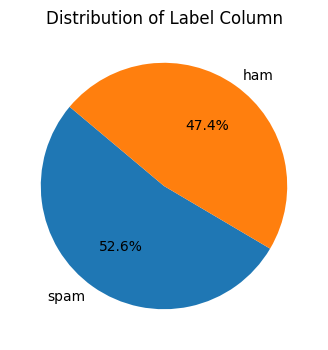

In [ ]:
# Plot the distribution of the 'label' column
plt.figure(figsize=(4, 4))
plt.pie(label_counts, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Label Column')
plt.show()

In [ ]:
# Function to preprocess text data
def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove non-alphabetic characters
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Tokenize the text
    words = text.split()
    # Remove stopwords
    words = [word for word in words if word not in stop_words]
    # Stemming
    words = [stemmer.stem(word) for word in words]
    # Lemmatization
    words = [lemmatizer.lemmatize(word) for word in words]
    return words

In [ ]:
# Apply preprocessing to the 'text' column
df['text'] = df['text'].apply(preprocess_text)

In [ ]:
df.head()

,label,text
0,1,"[ounc, feather, bowl, hummingbird, opec, momen..."
1,1,"[wulvob, get, medirc, onlin, qnb, ikud, viagra..."
2,0,"[comput, connect, cnn, com, wednesday, escapen..."
3,1,"[univers, degre, obtain, prosper, futur, money..."
4,0,"[thank, answer, guy, know, check, rsync, manua..."


In [ ]:
# Create a dictionary of words
word_dict = {}

def build_dictionary(text):
    for sublist in text:
        for word in sublist:
            if word not in word_dict:
                word_dict[word] = len(word_dict)

In [ ]:
build_dictionary(df['text'])

In [ ]:
# Count the frequency of each word
word_counter = Counter()
for sublist in df['text']:
    word_counter.update(sublist)

In [ ]:
word_counter.most_common(10)

[('escapenumb', 1141590),
 ('escapelong', 227221),
 ('http', 91458),
 ('com', 69835),
 ('r', 60751),
 ('enron', 52872),
 ('c', 51972),
 ('use', 46970),
 ('org', 43599),
 ('plea', 40727)]

In [ ]:
# Count total words
total_words = sum(word_counter.values())
total_words

14236264

In [ ]:
# Count the frequency of each unique word
word_probabilities = {word: count / total_words for word, count in word_counter.items()}

[('escapenumb', 0.08018887539596063),
 ('escapelong', 0.015960718345768243),
 ('http', 0.006424297835443344),
 ('com', 0.004905430244901331),
 ('r', 0.004267341487907221),
 ('enron', 0.0037138957243276747),
 ('c', 0.0036506768910719834),
 ('use', 0.0032993206644664637),
 ('org', 0.0030625310123498692),
 ('plea', 0.002860792691116152),
 ('list', 0.002858755639822358),
 ('u', 0.00285397910575415),
 ('help', 0.0028520825407564792),
 ('mail', 0.0027981358030449563),
 ('x', 0.0027555684553194574),
 ('e', 0.0027469285481078465),
 ('www', 0.002672119595421945),
 ('new', 0.0026089007621662537),
 ('compani', 0.002602930094580994),
 ('get', 0.002584385903492658),
 ('one', 0.002577993777019027),
 ('time', 0.002577923533870965),
 ('may', 0.002552916973160936),
 ('ect', 0.0024597745588308844),
 ('price', 0.0024217730157294077),
 ('would', 0.002387424116327149),
 ('samba', 0.002162294826788826),
 ('per', 0.002129069817755557),
 ('sourc', 0.002087415630954863),
 ('like', 0.0019911825181100884),
 ('ne

In [ ]:
# Define a threshold for common words
threshold = 0.001

# Filter words based on the threshold
most_common_words = [word for word, prob in word_probabilities.items() if prob > threshold]
most_common_words.sort()
print("Most common words:", most_common_words)
print("Number of most common words:", len(most_common_words))

['also', 'b', 'branch', 'busi', 'c', 'call', 'ch', 'chang', 'code', 'com', 'comment', 'compani', 'contain', 'could', 'custom', 'data', 'day', 'de', 'e', 'ect', 'email', 'energi', 'enron', 'escapelong', 'escapenumb', 'escapenumberd', 'escapenumbermg', 'ethz', 'file', 'first', 'follow', 'free', 'get', 'go', 'guid', 'h', 'help', 'hou', 'html', 'http', 'includ', 'inform', 'item', 'know', 'like', 'line', 'list', 'look', 'mail', 'mailman', 'make', 'manag', 'market', 'may', 'messag', 'n', 'name', 'need', 'new', 'news', 'number', 'offer', 'one', 'org', 'p', 'peopl', 'per', 'pill', 'plea', 'pm', 'post', 'power', 'price', 'product', 'project', 'provid', 'r', 'read', 'receiv', 'report', 'return', 'right', 'said', 'samba', 'save', 'say', 'secur', 'see', 'self', 'servic', 'set', 'sourc', 'stat', 'state', 'subject', 'system', 'take', 'test', 'thank', 'time', 'tri', 'u', 'use', 'want', 'watch', 'way', 'week', 'work', 'would', 'www', 'x', 'year']
112


In [ ]:
count_label_1 = df.loc[df['label'] == 1].shape[0]
count_label_0 = df.loc[df['label'] == 0].shape[0]
total_labels = df.shape[0]

In [ ]:
# Calculate prior probabilities for spam and ham
prior_spam = count_label_1 / total_labels
prior_ham = count_label_0 / total_labels

print(prior_spam)
print(prior_ham)

0.5261959543667913
0.4738040456332087


In [ ]:
# Separate spam and ham messages
df_spam = df.loc[df['label'] == 1, 'text']
df_ham = df.loc[df['label'] == 0, 'text']

0        [ounc, feather, bowl, hummingbird, opec, momen...
1        [wulvob, get, medirc, onlin, qnb, ikud, viagra...
3        [univers, degre, obtain, prosper, futur, money...
8        [work, gateway, world, art, explor, tattoo, fu...
9        [upon, account, cautious, escapenumb, men, wou...
                               ...                        
83439    [http, printlost, hk, viagra, escapenumb, pill...
83441    [lowest, price, hbie, qsxh, gycj, swlw, swsszg...
83444    [order, softwar, cd, download, site, immedi, d...
83445    [dear, valu, member, canadianpharmaci, provid,...
83447    [get, life, viagra, help, million, men, good, ...
Name: text, Length: 43910, dtype: object
2        [comput, connect, cnn, com, wednesday, escapen...
4        [thank, answer, guy, know, check, rsync, manua...
5        [larri, king, live, escapenumb, escapenumb, p,...
6        [michael, pobega, wrote, im, sure, mpl, mozill...
7        [hi, error, tr, sampl, escapenumb, escapenumb,...
               

In [ ]:
# Function to calculate conditional probabilities
def calculate_conditional_probabilities(text):
    word_dict_spam = {}
    word_dict_ham = {}

    # Count words in spam messages
    for message in df_spam:
        for word in message:
            if word in word_dict_spam:
                word_dict_spam[word] += 1
            else:
                word_dict_spam[word] = 1

    # Count words in ham messages
    for message in df_ham:
        for word in message:
            if word in word_dict_ham:
                word_dict_ham[word] += 1
            else:
                word_dict_ham[word] = 1

    return word_dict_spam, word_dict_ham

In [ ]:
word_dict_spam, word_dict_ham = calculate_conditional_probabilities(df)

In [ ]:
# Calculate total words in spam and ham messages
total_spam_words = sum(word_dict_spam.values())
total_ham_words = sum(word_dict_ham.values())
vocabulary = set(list(word_dict_spam.keys()) + list(word_dict_ham.keys()))

{'ounc': 110, 'feather': 113, 'bowl': 90, 'hummingbird': 7, 'opec': 26, 'moment': 1524, 'alabast': 14, 'valkyri': 5, 'dyad': 9, 'bread': 226, 'flack': 141, 'desper': 226, 'iambic': 5, 'hadron': 5, 'heft': 13, 'quell': 31, 'yoghurt': 5, 'bunkmat': 14, 'divert': 59, 'afterimag': 16, 'wulvob': 1, 'get': 14019, 'medirc': 5, 'onlin': 6731, 'qnb': 2, 'ikud': 1, 'viagra': 4289, 'escapenumb': 338233, 'levitra': 1264, 'ciali': 3082, 'imitrex': 18, 'flonax': 5, 'ultram': 132, 'vioxx': 118, 'ambien': 161, 'valium': 314, 'xannax': 9, 'soma': 438, 'meridia': 117, 'cysfrt': 1, 'ever': 2825, 'stop': 4375, 'wonder': 1208, 'much': 6031, 'averag': 854, 'man': 4475, 'pay': 3976, 'mediecin': 9, 'ap': 1158, 'painkil': 20, 'drug': 5631, 'improv': 2229, 'qualiti': 8220, 'life': 6177, 'weight': 3040, 'reduc': 1082, 'tablet': 419, 'mani': 6329, 'what': 483, 'wors': 193, 'mediucin': 9, 'cost': 2872, 'lot': 2944, 'brand': 3155, 'rfwur': 1, 'intrest': 22, 'http': 27871, 'dmvrwm': 1, 'remunerativ': 5, 'net': 7300,

In [ ]:
# Calculate conditional probabilities with Laplace smoothing
def calculate_conditional_probabilities_with_smoothing(word_dict_spam, word_dict_ham, total_spam_words, total_ham_words, vocabulary, lambda_smoothing=1):
    conditional_prob_spam = {}
    conditional_prob_ham = {}

    for word in vocabulary:
        count_spam = word_dict_spam.get(word, 0)
        count_ham = word_dict_ham.get(word, 0)

        # Calculate conditional probabilities with Laplace smoothing
        conditional_prob_spam[word] = (count_spam + lambda_smoothing) / (total_spam_words + lambda_smoothing * len(vocabulary))
        conditional_prob_ham[word] = (count_ham + lambda_smoothing) / (total_ham_words + lambda_smoothing * len(vocabulary))

    return conditional_prob_spam, conditional_prob_ham

In [ ]:
conditional_prob_spam, conditional_prob_ham = calculate_conditional_probabilities_with_smoothing(
    word_dict_spam, word_dict_ham, total_spam_words, total_ham_words, vocabulary
)

print("Conditional Probabilities for Spam:", conditional_prob_spam)
print("Conditional Probabilities for Ham:", conditional_prob_ham)

Conditional Probabilities for Spam: {'dft': 1.7830988617766725e-07, 'eevhch': 5.349296585330018e-07, 'thof': 3.566197723553345e-07, 'inforenquiri': 3.566197723553345e-07, 'yjgescapenumb': 3.566197723553345e-07, 'prbodycrc': 3.566197723553345e-07, 'revisionari': 1.426479089421338e-06, 'cutain': 7.13239544710669e-07, 'langinfo': 1.7830988617766725e-07, 'papli': 3.566197723553345e-07, 'efulli': 3.566197723553345e-07, 'cherri': 1.5512960097457052e-05, 'wang': 7.310705333284357e-06, 'silagedaydream': 3.566197723553345e-07, 'absehbar': 1.7830988617766725e-07, 'tosuch': 3.566197723553345e-07, 'undr': 1.2481692032436708e-06, 'orimuls': 1.7830988617766725e-07, 'yakutat': 8.915494308883363e-07, 'sourceif': 3.566197723553345e-07, 'nominet': 1.7830988617766725e-07, 'fisher': 5.527606471507685e-06, 'kpmkuh': 3.566197723553345e-07, 'befoah': 8.915494308883363e-07, 'commonp': 3.566197723553345e-07, 'chopstick': 1.0698593170660036e-06, 'bruyett': 1.7830988617766725e-07, 'trafiqu': 1.7830988617766725e-

In [ ]:
# Function to classify a message using Naive Bayes
def classify_message(message, conditional_prob_spam, conditional_prob_ham, prior_spam, prior_ham):
    spam_probability = math.log(prior_spam)
    ham_probability = math.log(prior_ham)

    for word in message:
        if word in conditional_prob_spam:
            spam_probability += math.log(conditional_prob_spam[word])
        if word in conditional_prob_ham:
            ham_probability += math.log(conditional_prob_ham[word])

    if spam_probability > ham_probability:
        return 1
    else:
        return 0

In [ ]:
# Apply classification to the dataset
predictions = df['text'].apply(lambda x: classify_message(x, conditional_prob_spam, conditional_prob_ham, prior_spam, prior_ham))

In [ ]:
# Evaluate the model
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

correct_predictions = df['label']

confusion = confusion_matrix(correct_predictions, predictions)
accuracy = accuracy_score(correct_predictions, predictions)
precision = precision_score(correct_predictions, predictions)
recall = recall_score(correct_predictions, predictions)
f1 = f1_score(correct_predictions, predictions)

print("Accuracy:", accuracy)
print("Confusion Matrix:\n", confusion)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

0        1
1        1
2        0
3        1
4        0
        ..
83443    0
83444    1
83445    1
83446    0
83447    1
Name: text, Length: 83448, dtype: int64
